# Fitness App User engagement

One of the most essential things you can do to maintain good health is to incorporate physical fitness into your regular routine. Individuals who are at a healthy weight and who are physically active live seven years longer on average than individuals who are obese and aren’t active. Being active helps prevent or delay chronic diseases and illnesses linked with aging. Therefore, active adults maintain their independence and quality of life longer as they age.


![](saa.jpg)

In [1]:
import plotly.express as px
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
tha1df = pd.read_csv('dashboard_tha_file1_shared.csv') 
tha1df.head() 

,timestamp,feature_used,user_id
0,2020-06-05 18:02:33,Viewed vital stats,208172482030
1,2020-06-29 20:53:20,Viewed vital stats,117400324493
2,2020-06-11 14:03:51,Viewed vital stats,107495484915
3,2020-06-29 21:04:27,Shared on social,193161971320
4,2020-06-29 21:12:23,Viewed vital stats,193161971320


In [366]:
tha2df = pd.read_csv('dashboard_tha_file2_shared.csv') 
tha2df.head() 

,date,user_id,is_new_user
0,2020-07-30,7458587,False
1,2020-09-20,41066110,False
2,2020-06-02,64064801,False
3,2020-06-09,64064801,False
4,2020-06-10,64064801,False


In [367]:
tha1df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62413 entries, 0 to 62412
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   timestamp     62413 non-null  object
 1   feature_used  62413 non-null  object
 2   user_id       62413 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 1.4+ MB


In [368]:
tha2df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28734 entries, 0 to 28733
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   date         28734 non-null  object
 1   user_id      28734 non-null  int64 
 2   is_new_user  28734 non-null  bool  
dtypes: bool(1), int64(1), object(1)
memory usage: 477.2+ KB


In [369]:
tha1df['timestamp']=pd.to_datetime(tha1df.timestamp)
tha1df.head()

,timestamp,feature_used,user_id
0,2020-06-05 18:02:33,Viewed vital stats,208172482030
1,2020-06-29 20:53:20,Viewed vital stats,117400324493
2,2020-06-11 14:03:51,Viewed vital stats,107495484915
3,2020-06-29 21:04:27,Shared on social,193161971320
4,2020-06-29 21:12:23,Viewed vital stats,193161971320


In [370]:
tha1df.timestamp.dt.date

0        2020-06-05
1        2020-06-29
2        2020-06-11
3        2020-06-29
4        2020-06-29
            ...    
62408    2020-09-14
62409    2020-09-14
62410    2020-09-07
62411    2020-09-07
62412    2020-09-07
Name: timestamp, Length: 62413, dtype: object

In [423]:
tha1df.timestamp.dt.month.value_counts()

8    18845
7    17647
9    15028
6    10893
Name: timestamp, dtype: int64

In [372]:
tha1df.timestamp.dt.hour


0        18
1        20
2        14
3        21
4        21
         ..
62408    20
62409    20
62410     0
62411     0
62412    13
Name: timestamp, Length: 62413, dtype: int64

In [373]:
tha1df.timestamp.dt.weekday

0        4
1        0
2        3
3        0
4        0
        ..
62408    0
62409    0
62410    0
62411    0
62412    0
Name: timestamp, Length: 62413, dtype: int64

In [374]:
tha1df.timestamp.dt.day_name()

0          Friday
1          Monday
2        Thursday
3          Monday
4          Monday
           ...   
62408      Monday
62409      Monday
62410      Monday
62411      Monday
62412      Monday
Name: timestamp, Length: 62413, dtype: object

In [375]:
vf=tha1df.timestamp.dt.day_name().value_counts()
vf


Sunday       10436
Tuesday       9295
Saturday      9016
Friday        8747
Wednesday     8448
Monday        8315
Thursday      8156
Name: timestamp, dtype: int64

In [376]:
tha1df.timestamp.dt.hour.value_counts()

17    5774
18    5586
15    5497
16    5036
19    4634
20    4416
21    4118
22    3963
14    3661
23    3019
0     2258
9     1512
1     1506
13    1407
2     1324
8     1190
4     1106
3      981
10     972
12     951
7      929
6      908
11     855
5      810
Name: timestamp, dtype: int64

In [377]:
tha1df['timestamp'].dt.strftime("%Y-%b-%d")

0        2020-Jun-05
1        2020-Jun-29
2        2020-Jun-11
3        2020-Jun-29
4        2020-Jun-29
            ...     
62408    2020-Sep-14
62409    2020-Sep-14
62410    2020-Sep-07
62411    2020-Sep-07
62412    2020-Sep-07
Name: timestamp, Length: 62413, dtype: object

In [3]:
tha1df['Month']=tha1df.timestamp.dt.month
tha1df['Hour']=tha1df.timestamp.dt.hour
tha1df['Date']=tha1df.timestamp.dt.strftime("%Y-%b-%d")
tha1df

AttributeError: Can only use .dt accessor with datetimelike values

In [379]:
fig = px.pie(tha1df, values='Hour', names='Month')
fig.show()

In [380]:
fig=px.scatter(tha1df,x='Date',y='Month',size="Hour",color="Month",size_max=60)
fig.show()

In [381]:

fig = px.histogram(tha1df, x="feature_used")
fig.show()

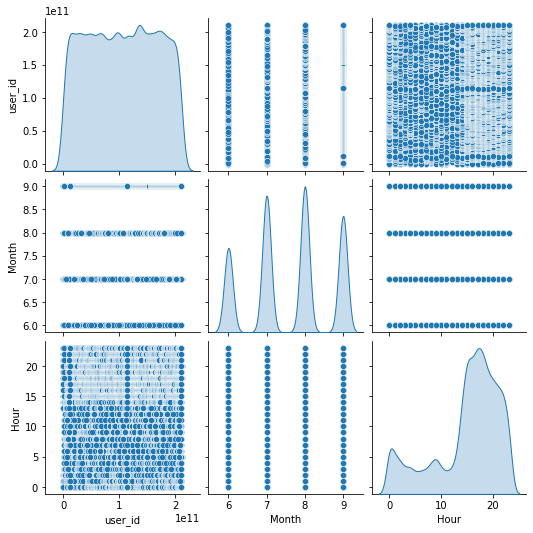

In [382]:
sns.pairplot(tha1df, diag_kind="kde")

In [383]:
tha1df.groupby(['Month'])['user_id'].sum().reset_index()

,Month,user_id
0,6,1136664919437486
1,7,1828752792802973
2,8,1981979969368697
3,9,1601627080838679


In [384]:
bf=tha1df.user_id.value_counts()
bf

77253776667     109
54698007344      96
97086209168      96
71342080882      92
64064801         92
               ... 
2238767856        1
132708836989      1
201167502475      1
122725377019      1
104156108049      1
Name: user_id, Length: 11197, dtype: int64

In [385]:
str(bf.max())

'109'

In [386]:
sf=tha1df.feature_used.value_counts()
sf

Viewed video exercise    38741
Viewed vital stats       18310
Shared on social          5362
Name: feature_used, dtype: int64

In [387]:

tha1df

,timestamp,feature_used,user_id,Month,Hour,Date
0,2020-06-05 18:02:33,Viewed vital stats,208172482030,6,18,2020-Jun-05
1,2020-06-29 20:53:20,Viewed vital stats,117400324493,6,20,2020-Jun-29
2,2020-06-11 14:03:51,Viewed vital stats,107495484915,6,14,2020-Jun-11
3,2020-06-29 21:04:27,Shared on social,193161971320,6,21,2020-Jun-29
4,2020-06-29 21:12:23,Viewed vital stats,193161971320,6,21,2020-Jun-29
...,...,...,...,...,...,...
62408,2020-09-14 20:56:09,Viewed video exercise,114410886618,9,20,2020-Sep-14
62409,2020-09-14 20:56:09,Viewed video exercise,114410886618,9,20,2020-Sep-14
62410,2020-09-07 00:43:47,Viewed vital stats,114419447890,9,0,2020-Sep-07
62411,2020-09-07 00:44:37,Viewed vital stats,114419447890,9,0,2020-Sep-07


In [388]:
sf=tha1df.groupby('user_id').mean()
sf

,Month,Hour
user_id,,
7458587,7.000000,16.000000
41066110,9.000000,17.000000
64064801,7.565217,14.619565
65094350,6.000000,12.000000
76923278,7.833333,15.833333
...,...,...
211001463758,7.909091,16.727273
211023403307,7.000000,1.000000
211043896702,6.000000,19.000000


In [389]:
tha1df.corr()

,user_id,Month,Hour
user_id,1.000000,0.015294,-0.004060
Month,0.015294,1.000000,-0.021187
Hour,-0.004060,-0.021187,1.000000


In [390]:
tha1df.isna().sum()

timestamp       0
feature_used    0
user_id         0
Month           0
Hour            0
Date            0
dtype: int64

In [391]:
tha1df_user_id_count = tha1df.groupby(['user_id'])['feature_used'].count().sort_values(ascending = False).reset_index()
tha1df_user_id_count 


,user_id,feature_used
0,77253776667,109
1,97086209168,96
2,54698007344,96
3,71342080882,92
4,64064801,92
...,...,...
11192,84568453034,1
11193,84544745800,1
11194,84380465324,1
11195,84317973334,1


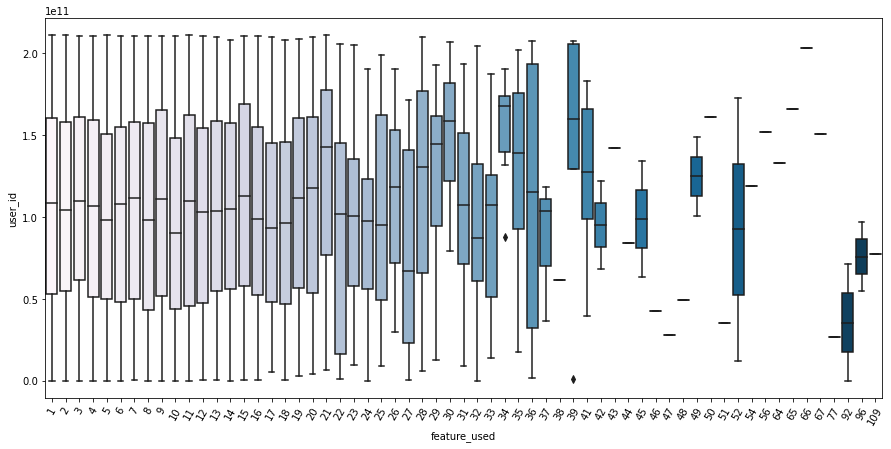

In [392]:
plt.figure(figsize=(15,7))
sns.boxplot(x="feature_used", y="user_id", data=tha1df_user_id_count, palette='PuBu')  ## Complete the code to visualize the relationship between food preparation time and cuisine type using boxplot
plt.xticks(rotation = 60)
plt.show()

<AxesSubplot:>

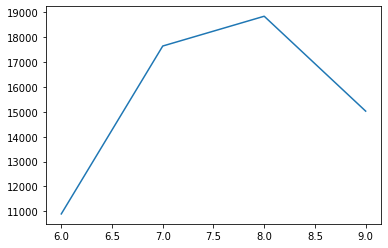

In [393]:
tha1df.Month.value_counts().sort_index().plot()

<AxesSubplot:>

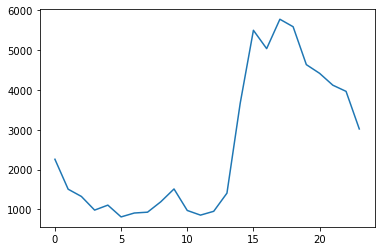

In [394]:
tha1df.Hour.value_counts().sort_index().plot()

<AxesSubplot:>

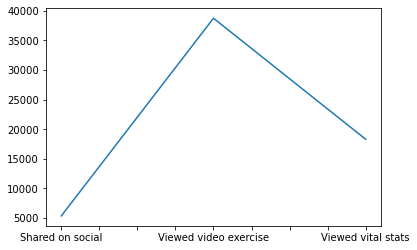

In [395]:
tha1df.feature_used.value_counts().sort_index().plot()

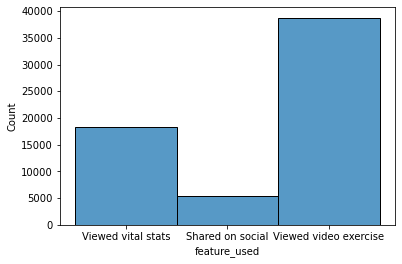

In [396]:
sns.histplot(data = tha1df, x = 'feature_used');

<__array_function__ internals>:5: RuntimeWarning:

Converting input from bool to <class 'numpy.uint8'> for compatibility.

<__array_function__ internals>:5: RuntimeWarning:

Converting input from bool to <class 'numpy.uint8'> for compatibility.



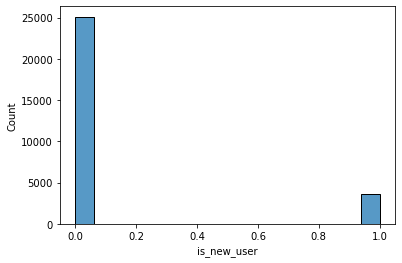

In [397]:
sns.histplot(data = tha2df, x = 'is_new_user');

In [403]:
from IPython.core.display import display, HTML

In [399]:
display(HTML("<div style = 'background-color: #504e4e; padding: 10px '>" +
             "<span style='color: #fff; font-size:30px;'> Number of Users: "  + str(len(bf)) +"</span>"+"</div>")
       )
display(HTML("<div style = 'background-color: #504e4e; padding: 10px '>" +
             "<span style='color: lightgreen; font-size:30px;'> Max number of times a user used the Fitness app: "  + str(bf.max()) +"</span>"+"</div>"))
display(HTML("<div style = 'background-color: #504e4e; padding: 10px '>" +
             "<span style='color: red; font-size:30px;'> Min number of times a user used the Fitness app: "  + str(bf.min()) +"</span>"+"</div>"))

In [400]:
display(HTML("<div style = 'background-color: #504e4e; padding: 10px '>" +
             "<span style='color: cyan; font-size:30px;'> Most used day: Sunday- "  + str(vf.max()) +"</span>"+"</div>")
       )
display(HTML("<div style = 'background-color: #504e4e; padding: 10px '>" +
             "<span style='color: yellow; font-size:30px;'> Least used day: Thursday- "  + str(vf.min())+"</span>"+"</div>"))

In [422]:

display(HTML("<div style = 'background-color: #504e4e; padding: 10px '>" +
             "<span style='color: violet; font-size:30px;'> Number of times video exercise was viewed: "  + str(int(38741)) +"</span>"+"</div>")
       )
display(HTML("<div style = 'background-color: #504e4e; padding: 10px '>" +
             "<span style='color: gold; font-size:30px;'> Number of times vital status was viewed: "  + str(int(18310)) +"</span>"+"</div>")
       )
display(HTML("<div style = 'background-color: #504e4e; padding: 10px '>" +
             "<span style='color: lightblue; font-size:30px;'> Number of times a user shared the Fitness app on social media: "  + str(int(5362)) +"</span>"+"</div>")
       )

In [401]:
ff=tha2df.is_new_user.value_counts()
ff

False    25103
True      3631
Name: is_new_user, dtype: int64

In [402]:
display(HTML("<div style = 'background-color: #504e4e; padding: 10px '>" +
             "<span style='color: pink; font-size:30px;'> Existing users: "  + str(ff.max()) +"</span>"+"</div>")
       )
display(HTML("<div style = 'background-color: #504e4e; padding: 10px '>" +
             "<span style='color: orange; font-size:30px;'> New users: "  + str(ff.min()) +"</span>"+"</div>"))

# Conclusion:
An increase in user engagement was observed in the mid summers of 2020.This is largely because of the global pandemic caused and due to the lockdown making it difficult for people who preferred to hit the gym for their physical fitness.
August had the maximum number of users while July the least.Popularity or the word of fame of this fitness app and its credibility must have been the significant reason to attract more users.
People prefer to workout on the weekends rather than weekdays which is when could find more time to relax.


# Recommendations:
Offering bonus workout tips, rewards,special diet tips ,motivating words after each accomplishment and personalised mentorship would help to reachout to a bigger audience and for present users to stay motivated.